# TRAININING script test

In [1]:
import os
os.chdir('../')

%load_ext autoreload
%autoreload 2

In [2]:
import fnmatch
import os
import sys
import time
import traceback
from pydoc import locate

import numpy as np

# TensorFlow 2.x compatibility
try:
    import tensorboard  # pylint: disable=import-error
    import tensorflow  # pylint: disable=import-error
    tensorflow.io.gfile = tensorboard.compat.tensorflow_stub.io.gfile
except (ModuleNotFoundError, AttributeError):
    pass

import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.utils.data

import distiller.apputils as apputils

# pylint: enable=no-name-in-module
import ai8x
import datasets
import parse_qat_yaml
import parsecmd

In [3]:
from train_test import create_model, update_old_model_params

## MAIN

In [4]:
"""main"""
#script_dir = os.path.dirname(__file__)
#script_dir = os. getcwd()

supported_models = []
supported_sources = []
model_names = []
dataset_names = []

In [5]:
# Dynamically load models
for _, _, files in sorted(os.walk('models')):
    for name in sorted(files):
        if fnmatch.fnmatch(name, '*.py'):
            fn = 'models.' + name[:-3]
            m = locate(fn)
            try:
                for i in m.models:
                    i['module'] = fn
                supported_models += m.models
                model_names += [item['name'] for item in m.models]
            except AttributeError:
                # Skip files that don't have 'models' or 'models.name'
                pass
# Dynamically load datasets
for _, _, files in sorted(os.walk('datasets')):
    for name in sorted(files):
        if fnmatch.fnmatch(name, '*.py'):
            ds = locate('datasets.' + name[:-3])
            try:
                supported_sources += ds.datasets
                dataset_names += [item['name'] for item in ds.datasets]
            except AttributeError:
                # Skip files that don't have 'datasets' or 'datasets.name'
                pass

In [6]:
# Parse arguments
cmd_line_args = """
    --epochs 1 --lr 3e-3 --optimizer Adam
    --deterministic --qat-policy qat_policy_wavenet.yaml --compress schedule_tcn.yaml 
    --model ai85reswavenet --dataset PEDALNET 
    --device MAX78000
    --regression
    --use-bias
    --custom-loss
    --output-bitdepth 30
"""
args = parsecmd.get_parser(model_names, dataset_names).parse_args(cmd_line_args.split())

In [7]:
# Set hardware device
ai8x.set_device(args.device, args.act_mode_8bit, args.avg_pool_rounding)

if args.cpu or not torch.cuda.is_available():
    if not args.cpu:
        print("WARNING: CUDA hardware acceleration is not available, training will be slow") # Print warning if no hardware acceleration
    # Set GPU index to -1 if using CPU
    args.device = 'cpu'
    args.gpus = -1
else:
    args.device = 'cuda'
    if args.gpus is not None:
        try:
            args.gpus = [int(s) for s in args.gpus.split(',')]
        except ValueError as exc:
            raise ValueError('ERROR: Argument --gpus must be a comma-separated '
                             'list of integers only') from exc
        available_gpus = torch.cuda.device_count()
        for dev_id in args.gpus:
            if dev_id >= available_gpus:
                raise ValueError('ERROR: GPU device ID {0} requested, but only {1} '
                                 'devices available'
                                 .format(dev_id, available_gpus))
        # Set default device in case the first one on the list != 0
        torch.cuda.set_device(args.gpus[0])

        
# DCOM dataset selection (regression vs classification)
selected_source = next((item for item in supported_sources if item['name'] == args.dataset))
args.labels = selected_source['output']
args.num_classes = len(args.labels)
if args.num_classes == 1 \
   or ('regression' in selected_source and selected_source['regression']):
    args.regression = True
dimensions = selected_source['input']
if len(dimensions) == 2:
    dimensions += (1, )
args.dimensions = dimensions

args.datasets_fn = selected_source['loader']


# Get policy for quantization aware training
qat_policy = parse_qat_yaml.parse(args.qat_policy) \
    if args.qat_policy.lower() != "none" else None

# Get policy for once for all training policy
nas_policy = parse_nas_yaml.parse(args.nas_policy) \
    if args.nas and args.nas_policy.lower() != '' else None

#if not args.load_serialized and args.gpus != -1 and torch.cuda.device_count() > 1:
#    model = torch.nn.DataParallel(model, device_ids=args.gpus).to(args.device)

Configuring device: MAX78000, simulate=False.
{'start_epoch': 100000000, 'weight_bits': 8}


### Load dataset

In [8]:
# Load the datasets
train_loader, val_loader, test_loader, _ = apputils.get_data_loaders(
    args.datasets_fn, (os.path.expanduser(args.data), args), args.batch_size,
    args.workers, args.validation_split, args.deterministic,
    args.effective_train_size, args.effective_valid_size, args.effective_test_size)

## ARGS

In [9]:
import IPython.display as ipd
import pickle
from matplotlib import pyplot as plt
import json
import argparse
%matplotlib inline  

In [10]:
model_path = "./logs/remote/2021.11.29-145104__resnokip_b128_ch12_dl7p3_lr3e-4_b30_q/" #"2021.11.11-123430_res+skip+yes_res_convs"

with open(model_path+'configs/commandline_args.txt', 'r') as f:
    loaded_args = json.load(f)
#args.num_hidden_channels = loaded_args["num_hidden_channels"]

print("num_hidden_channels",loaded_args["num_hidden_channels"])

print("num hidden channels",loaded_args["num_hidden_channels"])

num_hidden_channels 12
num hidden channels 12


# RESULSTS

In [11]:
(inputs, target) = next(iter(train_loader))
sr = 44100
sample_size = 4410 #HAS to be the same as x_train.size(2)
out_sample_size = 2362

In [12]:
import IPython.display as ipd
import pickle
from matplotlib import pyplot as plt
import json
import argparse
%matplotlib inline    

model_path = "./logs/remote/2021.11.29-160546__reskip_b128_ch12_dl7p3_lr3e-4_b30/" #"2021.11.11-123430_res+skip+yes_res_convs"

#model_path = "./logs/remote/2021.11.08-105618/"
#model_path = "./logs/remote/2021.11.03-144708/"
#model_path = "./logs/remote/2021.11.02-175213/"


#args.load_model_path = model_path+"checkpoint.pth.tar"
#args.load_model_path = model_path+"best.pth.tar"

args.load_model_path = model_path+model_path.split("__")[-1].split("/")[-2]+"_best.pth.tar" 


In [13]:
#parser = argparse.ArgumentParser()
#args1 = parser.parse_args()
with open(model_path+'configs/commandline_args.txt', 'r') as f:
    loaded_args = json.load(f)
args.num_hidden_channels = loaded_args["num_hidden_channels"]
print("num hidden channels",args.num_hidden_channels)


args.dilation_depth = loaded_args["dilation_depth"]
args.dilation_power = loaded_args["dilation_power"]
args.num_repeat = loaded_args["num_repeat"]
args.kernel_size = loaded_args["kernel_size"]

args.cnn = loaded_args["cnn"]
print("model",args.cnn)
print("dl",args.dilation_depth,"  p",args.dilation_power,"  r",args.num_repeat,"  k",args.kernel_size)

num hidden channels 12
model ai85reswavenet
dl 7   p 3   r 1   k 3


In [74]:
args.__dict__

{'device': 'cpu',
 'act_mode_8bit': False,
 'cnn': 'ai85reswavenet',
 'dataset': 'PEDALNET',
 'truncate_testset': False,
 'data': 'data',
 'workers': 4,
 'epochs': 1,
 'batch_size': 256,
 'kernel_stats': False,
 'use_bias': True,
 'avg_pool_rounding': False,
 'qat_policy': 'qat_policy_wavenet.yaml',
 'nas': False,
 'nas_kd_resume_from': '',
 'nas_policy': '',
 'nas_stage_transition_list': None,
 'optimizer': 'Adam',
 'lr': 0.003,
 'momentum': 0.9,
 'weight_decay': 0.0001,
 'print_freq': 10,
 'resumed_checkpoint_path': '',
 'load_model_path': './logs/remote/2021.11.29-160546__reskip_b128_ch12_dl7p3_lr3e-4_b30/reskip_b128_ch12_dl7p3_lr3e-4_b30_best.pth.tar',
 'pretrained': False,
 'reset_optimizer': False,
 'evaluate': False,
 'csv_prefix': None,
 'generate_sample': None,
 'shap': 0,
 'activation_stats': [],
 'masks_sparsity': False,
 'log_params_histograms': False,
 'summary': None,
 'summary_filename': 'model',
 'compress': 'schedule_tcn.yaml',
 'sensitivity': None,
 'sensitivity_range

In [51]:
loaded_args

{'device': 85,
 'act_mode_8bit': False,
 'cnn': 'ai85reswavenet',
 'dataset': 'PEDALNET',
 'truncate_testset': False,
 'data': 'data',
 'workers': 4,
 'epochs': 1500,
 'batch_size': 128,
 'kernel_stats': False,
 'use_bias': True,
 'avg_pool_rounding': False,
 'qat_policy': 'qat_policy_wavenet.yaml',
 'nas': False,
 'nas_kd_resume_from': '',
 'nas_policy': '',
 'nas_stage_transition_list': None,
 'optimizer': 'Adam',
 'lr': 0.0003,
 'momentum': 0.9,
 'weight_decay': 0.0001,
 'print_freq': 10,
 'resumed_checkpoint_path': '',
 'load_model_path': '',
 'pretrained': False,
 'reset_optimizer': False,
 'evaluate': False,
 'csv_prefix': None,
 'generate_sample': None,
 'shap': 0,
 'activation_stats': [],
 'masks_sparsity': False,
 'log_params_histograms': False,
 'summary': None,
 'summary_filename': 'model',
 'compress': 'schedule-wavenet.yaml',
 'sensitivity': None,
 'sensitivity_range': [0.0, 0.95, 0.05],
 'extras': None,
 'deterministic': True,
 'seed': None,
 'gpus': None,
 'cpu': False,


In [14]:
model = create_model(supported_models, dimensions, args)

In [15]:
update_old_model_params(args.load_model_path, model)
if qat_policy is not None:
    checkpoint = torch.load(args.load_model_path,
                            map_location=lambda storage, loc: storage)
    if checkpoint.get('epoch', None) >= qat_policy['start_epoch']:
        ai8x.fuse_bn_layers(model)
model = apputils.load_lean_checkpoint(model, args.load_model_path,
                                      model_device=args.device)
ai8x.update_model(model)

#model.eval()
print("shit")

shit


In [37]:
l = 4410
t = torch.linspace(0,l/sr,l)
#inputs = torch.sin(t*8000).reshape(1,1,l)
#inputs[0,0,:3000]=0
#target = inputs.clone()[:,:,-out_sample_size:]

In [38]:
#DELTA
l = 4410
#inputs = torch.zeros(1,1,l)
#inputs[0,0,l//2+100] = 1

In [16]:
outputs = model(inputs)

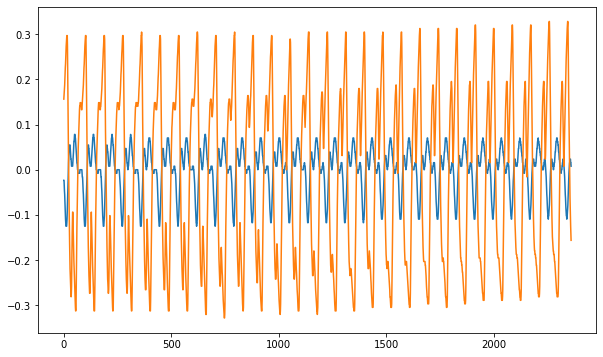

In [24]:
sample = 230 #106#20 #170 #84      #
n_samples = 100000
fig = plt.figure(figsize=(10,6))
plt.plot(inputs.detach()[sample,0,-out_sample_size:-out_sample_size+n_samples])#-out_sample_size:-out_sample_size+n_samples])
plt.plot(target.detach()[sample,0,:n_samples])#
#plt.plot(outputs.detach()[sample,0,:n_samples])

In [59]:
ipd.Audio(np.concatenate((outputs).squeeze().detach().numpy()),rate=sr)

In [45]:
ipd.Audio(np.concatenate((target).squeeze().detach().numpy()),rate=sr)

In [62]:
ipd.Audio(np.concatenate((inputs).squeeze().detach().numpy()),rate=sr)

In [34]:
ipd.Audio(outputs.squeeze().detach().numpy(),rate=sr)

In [63]:
# prepare and load test data
n_samples = 100 #*sr

data = pickle.load(open("data/AUDIO/data.pickle", "rb"))
x_test = data["x_test"] #/data["x_test"].max()
y_test = data["y_test"] #/data["y_test"].max()
x_test = x_test[:n_samples]
y_test = y_test[:n_samples]

x_test = x_test/30
y_test = y_test/y_test.max()

#x_test = (x_test*0.5*256.).round().clip(min=-128, max=127)/(128.)
#y_test = (y_test*0.5*256.).round().clip(min=-128, max=127)/(128.)

prev_sample = np.concatenate((np.zeros_like(x_test[0:1]), x_test[:-1]), axis=0)
pad_x_test = np.concatenate((prev_sample, x_test), axis=2)

pad_x_test = pad_x_test[:n_samples,:,:]

print("x_test shape ",x_test.shape)
print("pad_x_test shape",pad_x_test.shape)

x_test shape  (100, 1, 4410)
pad_x_test shape (100, 1, 8820)


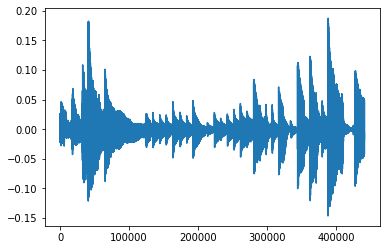

In [64]:
plt.plot(x_test.flatten())

In [65]:
y_pred = model(torch.tensor(pad_x_test))
y_pred = y_pred[:, :, -x_test.shape[2] :]

In [66]:
ipd.Audio(np.concatenate(y_pred.squeeze().detach().numpy()),rate=sr)

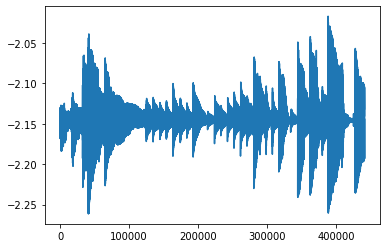

In [72]:
plt.plot(np.concatenate(y_pred.squeeze().detach().numpy()))

In [69]:
ipd.Audio(np.concatenate(x_test.squeeze()),rate=sr)

In [61]:
ipd.Audio(np.concatenate(y_test.squeeze()),rate=sr)

In [39]:
#quantize y test
x_test = (x_test*0.5*256.).round().clip(min=-128, max=127)/(128.)
y_test = (y_test*0.5*256.).round().clip(min=-128, max=127)/(128.)

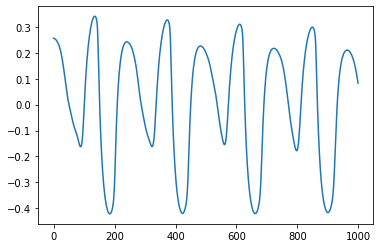

In [88]:
plt.plot(y_test[70,0,:1000])

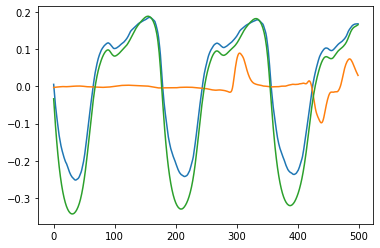

In [89]:
sample = 30
n_sampl = 500
plt.plot(y_pred[sample].squeeze().detach().numpy()[:n_sampl])
plt.plot(x_test[sample].squeeze()[-out_sample_size:-out_sample_size+n_sampl])
plt.plot(y_test[sample].squeeze()[:n_sampl])

In [43]:
outputs = model(inputs)

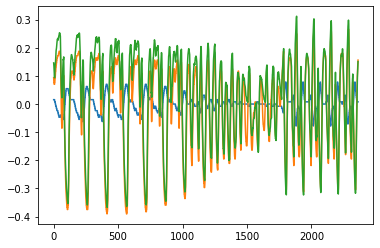

In [90]:
i = 250
plt.plot(inputs[i,:,-out_sample_size:].flatten().detach())
plt.plot(target[i].flatten().detach())
plt.plot(outputs[i].flatten().detach())

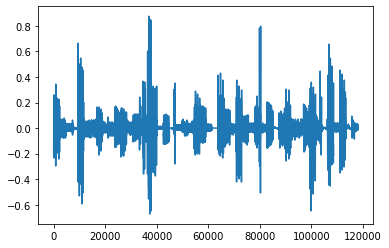

In [60]:
### plt.plot(inputs[0:50].flatten().detach())
#plt.plot(outputs[0:50].flatten().detach())
plt.plot((target)[0:50].flatten().detach())
#plt.plot((target*0.5-0.3)[0:50].flatten().detach())

## OTHER SHIT

In [315]:
#inp = torch.ones(1,1,4410)
#inp = ((torch.rand(1,1,4410)-0.5)*4.0).clamp(-2,2)
t = np.linspace(0,10,4410)
inp = torch.tensor(np.sin(t*100))*2
inp = inp.reshape(1,1,4410).float()

In [316]:
model.input_layer.op.weight.data[:,0,:] = torch.tensor([0,0,1])
#model.input_layer.op.weight.data[1,0,:] = torch.tensor([0,0,-1])
model.input_layer.op.weight.data[:,1:,:] = torch.tensor([0,0,0])
model.input_layer.op.bias.data[:] = 0

for l in model.hidden:
    l.op.weight.data[:,0,:] = torch.tensor([0,0,1])
    l.op.weight.data[:,1:,:] = torch.tensor([0,0,0])
    l.op.bias.data[:] = 0
model.linear_mix.op.weight.data[:,:,0] = torch.tensor([10,0,0,0,0,0,0,0,0,0,0,0])

In [318]:
out = model(inp)

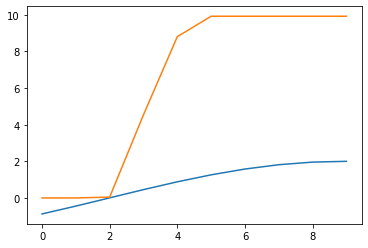

In [320]:
n = 10
plt.plot(inp[0,0,-out_sample_size:-out_sample_size+n].detach())
plt.plot(out[0,0,:n].detach())

In [150]:
for module in model.modules():
    if isinstance(module, ai8x.FusedConv1dReLU):
        module.clamp = ai8x.Empty()
    

In [151]:
model

AI85tcn(
  (hidden): ModuleList(
    (0): FusedConv1dReLU(
      (activate): ReLU(inplace=True)
      (op): Conv1d(12, 12, kernel_size=(3,), stride=(1,))
      (calc_out_shift): OutputShiftSqueeze()
      (calc_weight_scale): One()
      (scale): Scaler()
      (calc_out_scale): OutputScale()
      (quantize_weight): Empty()
      (quantize_bias): Empty()
      (clamp_weight): Empty()
      (clamp_bias): Empty()
      (quantize): Empty()
      (clamp): Empty()
      (quantize_pool): Empty()
      (clamp_pool): Empty()
    )
    (1): FusedConv1dReLU(
      (activate): ReLU(inplace=True)
      (op): Conv1d(12, 12, kernel_size=(3,), stride=(1,), dilation=(2,))
      (calc_out_shift): OutputShiftSqueeze()
      (calc_weight_scale): One()
      (scale): Scaler()
      (calc_out_scale): OutputScale()
      (quantize_weight): Empty()
      (quantize_bias): Empty()
      (clamp_weight): Empty()
      (clamp_bias): Empty()
      (quantize): Empty()
      (clamp): Empty()
      (quantize_pool): 